# Copula modelling with `pyvinecopulib`

* package website: https://vinecopulib.github.io/pyvinecopulib/index.html
* GitHub  website: https://github.com/vinecopulib/pyvinecopulib
* additional resources on copulas: https://www.groups.ma.tum.de/en/statistics/research/vine-copula-models/

In [1]:
# All the necessary packages:

# For copulas
import pyvinecopulib as pv
import copulas as cp

# For vector/matrix stuff
import numpy as np
import pandas as pd
from scipy.stats import norm
from scipy.stats import gaussian_kde
from scipy.spatial import Delaunay

# For plotting
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import plotly.graph_objects as go
import plotly.express as px
from matplotlib import cm
import seaborn as sns
sns.set()
import dash
import dash_core_components as dcc
import dash_html_components as html
import plotly.figure_factory as ff

# For financial data download
import yfinance as yf

## 1. Bivariate copulas

First we will show how to create a simple bivariate copula object using `pyvinecopulib`.

In [5]:
# Creating a copula
#cop=pv.Bicop()
cop= pv.Bicop(family = pv.BicopFamily.student, rotation =0, parameters=[-0.5,3])
#cop= pv.Bicop(family = pv.BicopFamily.gaussian, rotation =0, parameters=[0.56])
name_4_plots ="T"
print(cop)

<pyvinecopulib.Bicop>
Student, parameters = -0.5
   3


The `pv.Bicop` class handles most popular copula types (*Independence, Gaussian, Tstudent, Clayton, Gumbel, etc.*). All possible can be found through:

In [3]:
help(pv.BicopFamily)

Help on class BicopFamily in module pyvinecopulib:

class BicopFamily(pybind11_builtins.pybind11_object)
 |     A bivariate copula family identifier.
 |  
 |     The following convenient sets of families are also provided:
 |  
 |     - ``all`` contains all the families,
 |     - ``parametric`` contains the parametric families (all except ``tll``),
 |     - ``nonparametric`` contains the nonparametric families
 |       (``indep`` and ``tll``)
 |     - ``one_par`` contains the parametric families with a single parameter,
 |       (``gaussian``, ``clayton``, ``gumbel``, ``frank``, and ``joe``),
 |     - ``two_par`` contains the parametric families with two parameters
 |       (``student``, ``bb1``, ``bb6``, ``bb7``, and ``bb8``),
 |     - ``elliptical`` contains the elliptical families,
 |     - ``archimedean`` contains the archimedean families,
 |     - ``bb`` contains the BB families,
 |     - ``itau`` families for which estimation by Kendall's tau inversion is
 |       available (``in

The `pv.Bicop` object is equipped with the following methods which allow us to visualize the copulas:
* `pv.Bicop.pdf` - copula density
* `pv.Bicop.cdf` - copula density

Moreover, this class implements also methods like *loglik, aic, bic* and more, that we will make use of later on.


In [6]:
## Copula surface:
margin = 0.05

x = np.linspace(margin, 1-margin, 100)
y = np.linspace(margin, 1-margin, 100)
X,Y = np.meshgrid(x,y)
points2D = np.vstack([X.flatten(),Y.flatten()]).T

Z = cop.pdf(points2D)
Z = np.reshape(Z, np.shape(X))


fig = go.Figure(data=[go.Surface(z=Z, x=X, y=Y, colorscale='portland')])
                                 #+ contours = {"z": {"show": True, "start": 1, "end": 2, "size": 0.25}}, #izohipsy!
                                 

fig.update_layout(title=name_4_plots + " copula", autosize=False,
                  width=800, height=800,
                  margin=dict(l=65, r=50, b=65, t=90))

# Można walnąć online, w Dashu:
#app = dash.Dash()
#app.layout = html.Div([
#    dcc.Graph(figure=fig)
#])
#app.run_server(debug=True, use_reloader=False)  # Turn off reloader if inside Jupyter


# Albo tu w jupyterze:
fig.show()

In [7]:
margin=0.05
u = np.linspace(margin, 1-margin, 20)
v = np.linspace(margin, 1-margin, 20)
u,v = np.meshgrid(u,v)
u = u.flatten()
v = v.flatten()

points2D = np.vstack([u,v]).T
tri = Delaunay(points2D)
simplices = tri.simplices

Z = cop.pdf(points2D)
Z = np.reshape(Z, np.shape(u))


fig = ff.create_trisurf(x=u, y=v, z=Z,
                         simplices=simplices,
                         title="T Copula density", aspectratio=dict(x=1, y=1, z=1), colormap = 'Portland')
fig.show()

In [5]:
## Contour plot:
ncontours=  20
margin = 0.05

x = np.linspace(margin, 1-margin, 100)
y = np.linspace(margin, 1-margin, 100)
X,Y = np.meshgrid(x,y)
points2D = np.vstack([X.flatten(),Y.flatten()]).T

Z = cop.pdf(points2D)
Z = np.reshape(Z, np.shape(X))

# Filled
fig2 = go.Figure(data=[go.Contour(z= Z,x= x, y= x,
                                  line_smoothing = 0,
                                  ncontours = ncontours,
                                  autocontour = False,
                                  colorscale = 'portland',
                                 )
                     ]
               )

fig2.update_layout(title=name_4_plots+' copula contour (filled)',
                  autosize=False,
                  width=500, height=500,
                  margin=dict(l=65, r=50, b=65, t=90)
                 )

fig2.show()


# Lines only
fig3 = go.Figure(data=[go.Contour(z=Z,x =x, y=x,
                                 contours_coloring='lines',
                                 line_width=2,
                                 ncontours = ncontours,
                                 colorscale='portland',
                                  contours=dict(start=0, # lines setup
                                                end=3,
                                                size=.1)
                                 )
                     ]
               )

fig3.update_layout(title=name_4_plots+' copula contour (colored lines)', 
                  autosize=False,
                  width=500, height=500,
                  margin=dict(l=65, r=50, b=65, t=90)
                 )
fig3.show()

# Lines only
fig4 = go.Figure(data=[go.Contour(z= Z, x= x, y= x,
                                 contours_coloring='none',
                                 line_width=2,
                                 colorscale='portland',
                                 contours=dict(showlabels = True, # show labels on contours
                                               labelfont = dict( # label font properties
                                                                   size = 12,
                                                                   color = 'black'),
                                               
                                               start=0.05, # lines setup 
                                               end=3,
                                               size=.25
                                              )
                                )
                     ]
               )

fig4.update_layout(title=name_4_plots+' copula contour (b-w)', 
                  autosize=False,
                  width=500, height=500,
                  margin=dict(l=65, r=50, b=65, t=90)
                 )

fig4.show()

In [7]:
## Copula surface:
x = np.linspace(margin, 1-margin, 100)
y = np.linspace(margin, 1-margin, 100)
X,Y = np.meshgrid(x,y)
points2D = np.vstack([X.flatten(),Y.flatten()]).T

Z = cop.cdf(points2D)
Z = np.reshape(Z, np.shape(X))


fig = go.Figure(data=[go.Surface(z=Z, x=X, y=Y,
                                 #contours = {"z": {"show": True, "start": 1, "end": 2, "size": 0.25}}, #izohipsy!
                                 colorscale = 'portland')])
fig.update_layout(title=name_4_plots+' copula CDF', autosize=False,
                  width=800, height=800,
                  margin=dict(l=65, r=50, b=65, t=90))
fig.show()

# Contour CDF plot
fig = go.Figure(data=[go.Contour(z= Z, x= x, y= x,
                                 contours_coloring='none',
                                 line_width=2,
                                 colorscale='portland',
                                 contours=dict(showlabels = True, # show labels on contours
                                               labelfont = dict( # label font properties
                                                                   size = 12,
                                                                   color = 'black'),
                                               
                                               start=0, # lines setup 
                                               end=1,
                                               size=.1
                                              )
                                )
                     ]
               )

fig.update_layout(title=name_4_plots+' cdf contour', 
                  autosize=False,
                  width=500, height=500,
                  margin=dict(l=65, r=50, b=65, t=90)
                 )

fig.show()

In [7]:
## Copula with normal margins:

margin = 0.05
x = np.linspace(-3+margin, 3-margin, 100)

X,Y = np.meshgrid(x,x)
NX = norm.cdf(X)
NY = norm.cdf(Y)
NGRID = np.stack((np.ravel(NX),np.ravel(NY)), axis = 1)

nx = norm.pdf(x).reshape((1,len(x)))
adj = (nx.transpose()*nx).ravel()


nx = norm.pdf(x).reshape((1,len(x)))
adj = (nx.transpose()*nx).ravel()

Z = cop.pdf(NGRID)
Z = np.reshape(Z*adj, np.shape(X))


fig = go.Figure(data=[go.Surface(z=Z, x=X, y=Y,
                                 #contours = {"z": {"show": True, "start": 1, "end": 2, "size": 0.25}}, #izohipsy!
                                 colorscale = 'portland')])
fig.update_layout(title=name_4_plots+" copula", autosize=False,
                  width=800, height=800,
                  margin=dict(l=65, r=50, b=65, t=90))

fig.show()


In [8]:

fig2 = go.Figure(data=[go.Contour(z= Z,x= x, y= x,
                                  line_smoothing = 0,
                                  ncontours = ncontours,
                                  autocontour = False,
                                  colorscale = 'portland',
                                 )
                     ]
               )

fig2.update_layout(title=name_4_plots+' copula contour (filled)',
                  autosize=False,
                  width=500, height=500,
                  margin=dict(l=65, r=50, b=65, t=90)
                 )

fig2.show()

# Lines only
fig4 = go.Figure(data=[go.Contour(z= Z, x= x, y= x,
                                 contours_coloring='none',
                                 line_width=2,
                                 colorscale='portland',
                                 contours=dict(showlabels = True, # show labels on contours
                                               labelfont = dict( # label font properties
                                                                   size = 12,
                                                                   color = 'black'),
                                              )
                                )
                     ]
               )

fig4.update_layout(title=name_4_plots+' copula contour (b-w)', 
                  autosize=False,
                  width=500, height=500,
                  margin=dict(l=65, r=50, b=65, t=90)
                 )

fig4.show()

Let's integrate those plots into a dedicated function to facilitiate plotting.

In [10]:
def plot_copula(Copula, fun ="pdf" ,kind="contour:b&w", margins ="unif", points_n = 50, delta = 0.05, quantiles=[0.05,0.25,0.5,0.75,0.95], title="", **kwargs):
    
    # Some preliminary checks
    assert fun in ["pdf","cdf","ppf","quantile"]
    assert kind in ['contour:fill','contour:b&w','contour:c','3D:plain','3D:triangulated']
    assert margins in ['unif','norm']
    assert delta >=0 and delta <=1
    
    #Preparing [0,1]x[0,1] grid
    if fun != 'quantile':
        if margins == "unif":
            x = np.linspace(delta, 1-delta, points_n) #delta to avoid boundaries (exploding copula values are bad plot)
            X,Y = np.meshgrid(x,x)
            GRID = np.stack((np.ravel(X),np.ravel(Y)), axis = 1)
            adj = 1 # adjustment (multiplier) for margins transforming

        else:
            x = np.linspace(-5, 5, points_n)
            X,Y = np.meshgrid(x,x)
            NX = norm.cdf(X)
            NY = norm.cdf(Y)
            GRID = np.stack((np.ravel(NX),np.ravel(NY)), axis = 1)
            nx = norm.pdf(x).reshape((1,len(x)))
            adj = (nx.transpose()*nx).ravel()
    
    else: # if quantile
        q = np.array(quantiles)
        if margins=='norm':
            x = np.linspace(-5, 5, 100)
            xn = norm.cdf(x)
            Y,X = np.meshgrid(q,xn)
        else:
            x = np.linspace(0, 1, 100)
            Y,X = np.meshgrid(q,x)

        GRID = np.vstack([X.flatten(),Y.flatten()]).T
    
    # Select appropriate function
    if fun !="quantile":
        
        if fun=="pdf":
            Z = Copula.pdf(GRID)
        elif fun =="cdf":
            Z = Copula.cdf(GRID)
        # Adjust values in case of standard normal margins choice
        Z = np.reshape(Z*adj, np.shape(X))
    else:
        Z = Copula.hinv1(GRID)
        if margins =="norm":
            Z = norm.ppf(Z)
        adj = 1
        Z = np.reshape(Z, (len(x),len(q)))

    
    # plotting
    if fun == "quantile":
        CopulaQuantiles = pd.DataFrame(data=Z, index = x,columns = [str(Q) for Q in q])
        fig = make_subplots(rows=1, cols=1)

        #color_list = sns.color_palette("magma",5)
        color_list = sns.color_palette("mako",5)

        colors = []
        for color in color_list:
            new_color=[]
            for value in color:
                new_color.append(round(value*255))
            colors.append(new_color)
        colors
        linestyles = ['solid','dash']
        
        for i,Q in enumerate(reversed(q)):
            c = colors[i]
            fig.add_trace(go.Scatter(name = str(Q),x=x, y=CopulaQuantiles[str(Q)],
                                     marker_color='rgba({}, {}, {}, .8)'.format(c[0],c[1],c[2]),
                                     line={'dash': linestyles[i%2]}))     

        fig['layout'].update(width=500, height=500, autosize=False, title=title)
        return fig

    elif kind.split(":")[0] =="contour":
        plot_fun = go.Contour
        X=x # contour plots take only array, not matrices
        Y=x
        
        if kind.split(":")[1] =="b&w":
            specs =dict(contours_coloring='none',
                        line_width=2,
                        colorscale='portland',
                        contours=dict(showlabels = True, labelfont = dict(size = 12, color = 'black'))
                       )
            
        if kind.split(":")[1]=="fill":
            specs = dict(line_smoothing = 0,
                         ncontours = ncontours,
                         autocontour = False,
                         colorscale = 'portland')
        if kind.split(":")[1]=="c":
            specs = dict(contours_coloring='lines',
                         line_width=2,
                         ncontours = ncontours,
                         colorscale='portland')
    else:
        plot_fun = go.Surface
        specs=dict(colorscale='portland')
        
        if kind.split(":")[1]=="triangulated":
            X= X.flatten()
            Y= Y.flatten()
            Z = np.reshape(Z, np.shape(X))
            
            points2D = np.vstack([X,Y]).T
            tri = Delaunay(points2D)
            simplices = tri.simplices

            fig = ff.create_trisurf(x=X, y=Y, z=Z,
                                    simplices=simplices,
                                    title = title,
                                    colormap = 'Portland')
            return fig
        
    # Override/add user plot choices
    specs.update(**kwargs)
    
    # Plot
    fig = go.Figure(data=[plot_fun(z=Z, x=X, y=Y, **specs)])
    
        
    fig.update_layout(title=title, 
                      autosize=True,
                      width=700, height=700)

    return fig

In [11]:
plot_copula(cop, fun ="pdf" ,kind="3D:triangulated",points_n=20, margins ="unif", title= "Clayton copula contour pdf")

## Fitting to real data

Here we're going to take daily returns of **APPLE Inc.** and **ALPHABET Inc.** stock and estimate their marginal distributions, as well as fit bivariate copula dependency with `pyvinecopulib.Bicop`. 

In [21]:
AAPL_Data = yf.download(tickers=['AAPL'],start='2015-01-01',end='2020-01-01')['Adj Close']
GOOG_Data = yf.download(tickers=['GOOG'],start='2015-01-01',end='2020-01-01')['Adj Close']
TSLA_Data = yf.download(tickers=['TSLA'],start='2015-01-01',end='2020-01-01')['Adj Close']

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Let's start and define a class representing a sample empirical distribution. 

The goal is to have a meaningful object:
* containing the data
* with methods for  pdf, cdf and ppf computation
* basic graphic capabilities
* `scipy.stats` distribution library fitting.

In [13]:
from scipy.stats import gaussian_kde, iqr
from scipy.interpolate import interp1d
from statsmodels.distributions.empirical_distribution import ECDF
from plotly.subplots import make_subplots
import plotly.figure_factory as ff
import plotly.io as pio
pio.templates.default = 'seaborn'

%matplotlib inline

import warnings
import numpy as np
import pandas as pd
import scipy.stats as st
import statsmodels.api as sm
import matplotlib
import matplotlib.pyplot as plt
from scipy.stats._continuous_distns import _distn_names

matplotlib.rcParams['figure.figsize'] = (16.0, 12.0)
matplotlib.style.use('seaborn')

class edfun():
    
    def __init__(self, data, name):
        
        self.name = name
        self.data = data
        self.pdf= gaussian_kde(data)
        self.cdf= ECDF(data)
        self.ppf = lambda x: np.quantile(data, x)
        
    def visualize(self, kind = "all", points_n=100):
        t = np.linspace(min(self.data)*1.05,max(self.data)*1.05, points_n)
        
        if kind=="all":
            fig = make_subplots(rows=2, cols=1,
                                subplot_titles=("PDF","CDF"),
                               horizontal_spacing=0.1,
                               vertical_spacing= 0.1,
                               shared_xaxes=True)
            fig.add_trace(go.Histogram(x=self.data,histnorm='probability density'), row=1, col=1)
            fig.add_trace(go.Scatter(x=t, y=self.pdf(t)), row=1, col=1)
            fig.add_trace(go.Scatter(x=t, y=self.cdf(t)), row=2, col=1)            
            fig.update_layout(title_text=u'<span style="font-weight:bold">{} sample</span b> <br> <span style="font-size: 12px;">(empirical distribution)</span>.'.format(self.name),showlegend=False)
            
        elif kind =="pdf":
            # Freedman-Diaconis binning
            bin_size = 2* iqr(self.data)*len(self.data)**(-1/3)
            
            fig = make_subplots(rows=2, cols=1)
            fig.add_trace(go.Scatter(name = 'pdf', x=t, y=self.pdf(t)), row=1, col=1)
            fig.update_layout(height=600, width=600, title_text=u'<span style="font-weight:bold">{} sample</span b> <br> <span style="font-size: 12px;">(kernel smoothed density)</span>.'.format(self.name))
            
        else:
            if kind =="cdf":
                plot_fcn = self.cdf
            elif kind =="ppf":
                plot_fcn = self.ppf
                t = np.linspace(0,1, points_n)
            
            fig = make_subplots(rows=1, cols =1)
            fig.add_trace(go.Scatter(name = kind, x=t, y=plot_fcn(t)), row =1, col=1)
            fig.update_layout(height=400, width=600, title_text=u'<span style="font-weight:bold">{} sample</span> <br> <span style="font-size: 12px;">(distribution {})</span>.'.format(self.name, kind))
            
        return fig
    
    def best_fit(self, bins=200, plot_ =True, which = "top"):
        """Model data by finding best fit distribution to data"""
        data = self.data

        if plot_==True:
            plt.figure(figsize=(12,8))
            ax = data.plot(kind='hist', bins=50, density=True, alpha=0.5, color=list(matplotlib.rcParams['axes.prop_cycle'])[1]['color'])
            # Save plot limits
            dataYLim = ax.get_ylim()

            # Get histogram of original data
        y, x = np.histogram(data, bins=bins, density=True)
        x = (x + np.roll(x, -1))[:-1] / 2.0

        # Distributions to check
        if which == 'top':
            dist_menu = ['norm','alpha','beta','burr','cauchy','chi','chi2','expon','exponnorm','exponweib',
                         'f','frechet_r','frechet_l','genlogistic','genpareto','genexpon','genextreme','gamma',
                         'erlang','gengamma','gumbel_r','gumbel_l','halfnorm','laplace','levy','levy_l',
                         'lognorm','t','pareto','powerlaw','rayleigh','skewnorm','uniform']

        elif which == 'all':
            dist_menu  = _distn_names.copy()
            dist_menu.remove("levy_stable")

        else:
            dist_menu = which

        DISTRIBUTIONS = [getattr(st, distname) for distname in dist_menu] # ALL

        # Best holders
        best_distribution = st.norm
        best_params = (0.0, 1.0)
        best_sse = np.inf

        # Estimate distribution parameters from data
        for distribution in DISTRIBUTIONS:
            #print(distribution.name)
            # Try to fit the distribution
            try:
                #breakpoint()
                # Ignore warnings from data that can't be fit
                with warnings.catch_warnings():
                    warnings.filterwarnings('ignore')

                    # fit dist to data
                    params = distribution.fit(data)

                    # Separate parts of parameters
                    arg = params[:-2]
                    loc = params[-2]
                    scale = params[-1]

                    # Calculate fitted PDF and error with fit in distribution
                    pdf = distribution.pdf(x, loc=loc, scale=scale, *arg)
                    sse = np.sum(np.power(y - pdf, 2.0))

                    # identify if this distribution is better
                    if best_sse > sse > 0:
                        best_distribution = distribution
                        best_params = params
                        best_sse = sse
                    
                    # if axis pass in add to plot
                    try:
                        if ax:
                            pd.Series(pdf, x).plot(ax=ax)
                        end
                    except Exception:
                        pass

            except Exception:
                pass
        self.fitted_description =dict({'Object':best_distribution,'Name':best_distribution.name,'Parameters':best_params,'SSE':best_sse})
        self.fitted_distribution = best_distribution(*best_params) # frozen best distribution @ best params
        
        if plot_:
            best_dist = best_distribution
            best_fit_params = best_params
            
            # Update plots
            ax.set_ylim(dataYLim)
            ax.set_title(u'{} daily returns.\n All Fitted Distributions'.format(self.name))
            ax.set_xlabel(u'x')
            ax.set_ylabel('Frequency')

            # Make PDF with best params 
            pdf = make_pdf(best_dist, best_fit_params)

            # Display
            plt.figure(figsize=(12,8))
            ax = pdf.plot(lw=2, label='PDF', legend=True)
            data.plot(kind='hist', bins=50, density=True, alpha=0.5, label='Data', legend=True, ax=ax)

            param_names = (best_dist.shapes + ', loc, scale').split(', ') if best_dist.shapes else ['loc', 'scale']
            param_str = ', '.join(['{}={:0.2f}'.format(k,v) for k,v in zip(param_names, best_fit_params)])
            dist_str = '{}({})'.format(best_dist.name, param_str)

            ax.set_title(u'{} daily returns with best fit distribution \n {}'.format(self.name, dist_str))
            ax.set_xlabel(u'x')
            ax.set_ylabel('Frequency')

            
        return (best_distribution.name, best_params)

    
def make_pdf(dist, params, size=10000):
    """Generate distributions's Probability Distribution Function """

    # Separate parts of parameters
    arg = params[:-2]
    loc = params[-2]
    scale = params[-1]

    # Get sane start and end points of distribution
    start = dist.ppf(0.01, *arg, loc=loc, scale=scale) if arg else dist.ppf(0.01, loc=loc, scale=scale)
    end = dist.ppf(0.99, *arg, loc=loc, scale=scale) if arg else dist.ppf(0.99, loc=loc, scale=scale)

    # Build PDF and turn into pandas Series
    x = np.linspace(start, end, size)
    y = dist.pdf(x, loc=loc, scale=scale, *arg)
    pdf = pd.Series(y, x)

    return pdf
# Example use: 
#AAPL_ED = edfun(AAPL_Data.pct_change().dropna(), 'Apple stock daily returns')
#GOOG_ED = edfun(GOOG_Data.pct_change().dropna(), 'Google stock daily returns')
#TSLA_ED = edfun(TSLA_Data.pct_change().dropna(), 'Tesla stock daily returns')

* The `edfun` class allows for empirical pdf, cdf and ppf calculations using respectively `.pdf()`, `.cdf()`, `.ppf()` with basic graphing capabilities.
* It can also use the `.best_fit()` method which `scipy.stats` distribution library. This method allows to optimize the search using the 'which' argument that can be set to 'all' (the whole library), 'top' (arbitrarly chosen), or a custom list of scipy distribution names to look through 

In [27]:
GOOG_ED.visualize(kind='all')
AAPL_ED.visualize(kind = 'all')
TSLA_ED.visualize(kind = 'all')

In [15]:
fig = ff.create_2d_density(
    AAPL_ED.data, GOOG_ED.data,title = "Stock returns scatterplot")
fig.update_xaxes(title="GOOG")
fig.update_yaxes(title="AAPL")
fig.show()

The `scipy.stats` distributions are fitted as presented below. The 'best fit' is then stored inside the `.fitted_distribution` argument, as an object with it's own methods for pdf, cdf, etc.

{'Object': <scipy.stats._continuous_distns.t_gen at 0x25cc2eec8b0>,
 'Name': 't',
 'Parameters': (3.1816607699559527, 0.000989107208454945, 0.00952676264710689),
 'SSE': 734.1103087541339}

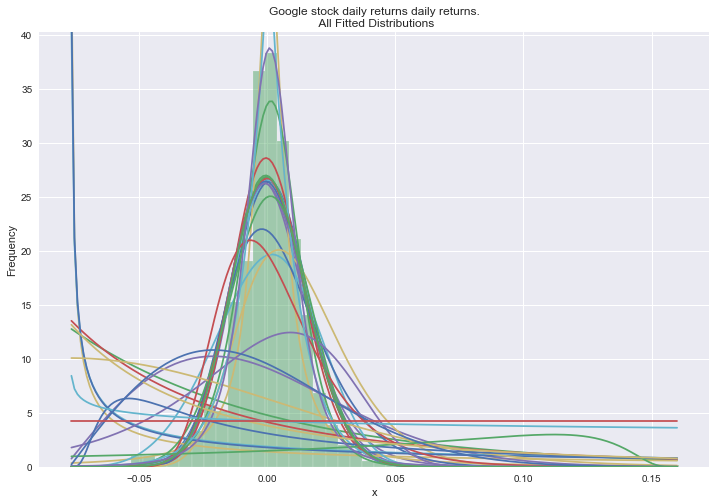

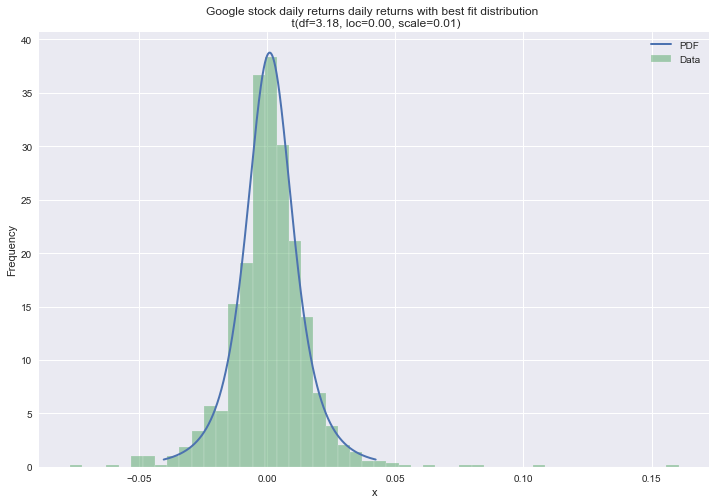

In [33]:
AAPL_ED.best_fit(which='top', plot_ = False)
TSLA_ED.best_fit(which='top',plot_ = False)
GOOG_ED.best_fit(which='top', plot_=True)

# Short description of chosen distribution
GOOG_ED.fitted_description

If the empirical distribution $CDF_{emp}$ is fitted to data correctly to the data $X$, then by setting $Y = CDF_{emp}(X)$ we should arrive approximately at the $Y\sim\mathcal{U}(0,1)$ distribution. This is also known as the [*probability integral transform*](https://www.maths.lancs.ac.uk/~nealp/pitslides.pdf).

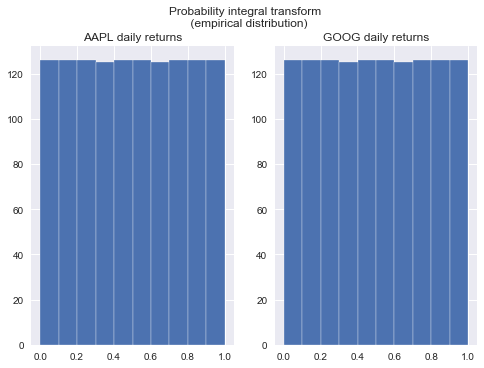

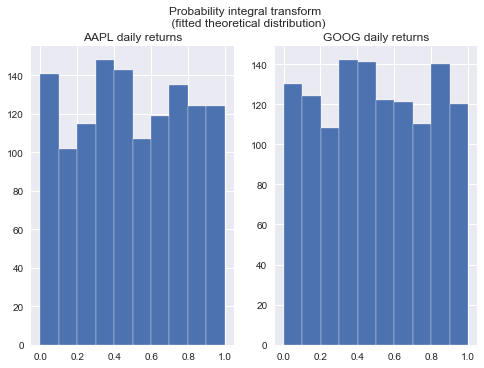

In [17]:
fig, (ax1,ax2) = plt.subplots(1,2)
ax1.hist(AAPL_ED.cdf(AAPL_ED.data))
ax1.set_title("AAPL daily returns")
ax2.hist(GOOG_ED.cdf(GOOG_ED.data))
ax2.set_title("GOOG daily returns")
_=fig.suptitle("Probability integral transform \n (empirical distribution)")

fig2, (ax1,ax2) = plt.subplots(1,2)
ax1.hist(AAPL_ED.fitted_distribution.cdf(AAPL_ED.data))
ax1.set_title("AAPL daily returns")
ax2.hist(GOOG_ED.fitted_distribution.cdf(GOOG_ED.data))
ax2.set_title("GOOG daily returns")
_=fig2.suptitle("Probability integral transform \n (fitted theoretical distribution)")

Having transformed the marginal distributions into uniform margins, we can proceed to vizualizing their dependence. A nice way to do that is the density heatmap presented below. We're also going to use the `pyvinecopulib.Bicop().select()` method to choose the best fitting copula structure.

In [18]:
import plotly.figure_factory as ff

A_T = AAPL_ED.cdf(AAPL_ED.data)
G_T = GOOG_ED.cdf(GOOG_ED.data)
#plt.scatter(A_T,G_T)

Model = pv.Bicop()
Model.select(data = np.column_stack([A_T,G_T]), controls = pv.FitControlsBicop(family_set = pv.parametric))
print("""Chosen Copula Model: \n {}""".format(Model))

fig = ff.create_2d_density(
    A_T, G_T,title = "Uniform marginals scatterplot")
fig.update_xaxes(title="GOOG")
fig.update_yaxes(title="AAPL")
fig.show()

plot_copula(Model, kind = 'contour:c', title = "Model for GOOG vs AAPL returns", points_n=100)

Chosen Copula Model: 
 <pyvinecopulib.Bicop>
Gumbel 180°, parameters = 1.61448


In [19]:
plot_copula(Model, kind = '3D:triangulated', title = "Model of Google/Apple returns dependency")

In [15]:
plot_copula(cop, fun ="quantile", margins = 'unif', points_n=100)

## Multiple dimensions:

We're going to work in 3 dimensions now, using pair-copula constructions.

In [46]:
Data = pd.DataFrame({'GOOG':GOOG_ED.data, 'AAPL':AAPL_ED.data, 'TSLA':TSLA_ED.data})
u = pv.to_pseudo_obs(Data)
controls = pv.FitControlsVinecop(family_set=pv.parametric)
cop = pv.Vinecop(u, controls=controls)

In [48]:
cop

<pyvinecopulib.Vinecop>
** Tree: 0
1,2 <-> Student, parameters = 0.567216
 3.70628
2,3 <-> BB8 180°, parameters =  1.92052
0.847447
** Tree: 1
1,3 | 2 <-> Gumbel 180°, parameters = 1.10754

In [49]:
cop.matrix

array([[2, 3, 3],
       [3, 2, 0],
       [1, 0, 0]], dtype=uint64)

In [52]:
cop.pair_copulas

[[<pyvinecopulib.Bicop>
  Student, parameters = 0.567216
   3.70628,
  <pyvinecopulib.Bicop>
  BB8 180°, parameters =  1.92052
  0.847447],
 [<pyvinecopulib.Bicop>
  Gumbel 180°, parameters = 1.10754]]

In [53]:
cop.structure

<pyvinecopulib.RVineStructure>
2 3 3 
3 2 
1 